<a href="https://colab.research.google.com/github/darrickpang/Email/blob/master/Food_classification2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q tensorflow tensorflow-datasets

import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
(ds_train, ds_test), info = tfds.load(
    "food101",
    split=["train[:10%]", "validation[:10%]"],
    as_supervised=True,
    with_info=True
)

class_names = info.features["label"].names
NUM_CLASSES = info.features["label"].num_classes

In [ ]:
IMG_SIZE = 224
BATCH_SIZE = 32

def preprocess(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

ds_train = ds_train.map(preprocess).shuffle(1000).batch(BATCH_SIZE)
ds_test = ds_test.map(preprocess).batch(BATCH_SIZE)

In [ ]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    include_top=False,
    weights="imagenet"
)

base_model.trainable = False  # Freeze pretrained layers

In [ ]:
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(256, activation="relu"),
    tf.keras.layers.Dense(NUM_CLASSES, activation="softmax")
])

In [ ]:
model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

history = model.fit(ds_train, validation_data=ds_test, epochs=3)

In [ ]:
img_path = "/content/drive/MyDrive/20251128_113501.jpg"

In [ ]:
img = tf.keras.utils.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
img = tf.keras.utils.img_to_array(img) / 255.0
img = np.expand_dims(img, axis=0)

pred = model.predict(img)
predicted_class = class_names[np.argmax(pred)]

print("Predicted Food:", predicted_class)

In [ ]:
!pip install -q ultralytics opencv-python


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")  # nano version = fastest

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
img_path = "/content/drive/MyDrive/20251128_113501.jpg"


image 1/1 /content/drive/MyDrive/20251128_113501.jpg: 384x640 2 cakes, 420.3ms
Speed: 13.0ms preprocess, 420.3ms inference, 35.4ms postprocess per image at shape (1, 3, 384, 640)


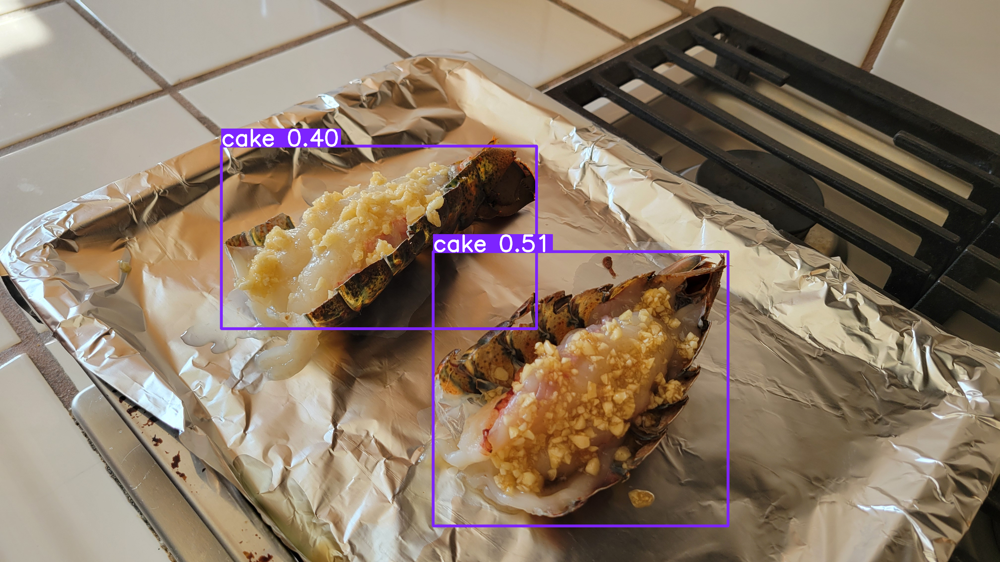

In [ ]:
results = model(img_path, conf=0.4)
results[0].show()